In [48]:
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import os 
from PIL import Image
import xml.etree.ElementTree as ET
from PIL import ImageDraw
import torch
from torch.utils.data import random_split
import torchvision
import torch.optim as optim

In [3]:
def parse_annotations(xml_path):
    tree = ET.parse(xml_path) # get the path for the xml file
    root = tree.getroot() # get the root tag

    boxes = []
    labels = []
    for obj in root.findall("object"):

        name = obj.find("name").text
        bbox = obj.find("bndbox")

        # we go deeper in the tags - object -> bndbox -> <xmin,xmax....> we convert into integer
        x_min = int(bbox.find("xmin").text)
        x_max = int(bbox.find("xmax").text)
        y_min = int(bbox.find("xmin").text)
        y_max = int(bbox.find("xmax").text)           
        

        labels.append(name)
        boxes.append([x_min, y_min,x_max, y_max])

    return boxes, labels

In [4]:


def read_files(xml_dir, image_dir):
    dataset = []
    
    for filename in os.listdir(image_dir):
        
        address = os.path.join(image_dir, filename)
        if not filename.endswith(".jpg"):
            continue


        xml_file = filename.replace("jpg", "xml")
        xml_path = os.path.join(xml_dir, xml_file)



        boxes, labels = parse_annotations(xml_path)
        image = Image.open(address)

        sample = {
            "box": boxes,
            "label": labels,
            "image": image
        }
        
        dataset.append(sample)

    return dataset



In [65]:
print(ET)

<module 'xml.etree.ElementTree' from '/usr/lib/python3.10/xml/etree/ElementTree.py'>


In [5]:
dataset = read_files(
    "/home/users/mms00747/Downloads/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/Annotations",
    "/home/users/mms00747/Downloads/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages"
)

In [6]:
print(dataset)

[{'box': [[2, 2, 500, 500]], 'label': ['bicycle'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F104D00FA0>}, {'box': [[1, 1, 356, 356]], 'label': ['car'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3D00>}, {'box': [[186, 186, 337, 337], [373, 373, 452, 452]], 'label': ['horse', 'horse'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x326 at 0x71F00BDC3D60>}, {'box': [[29, 29, 410, 410], [20, 20, 170, 170], [300, 300, 441, 441]], 'label': ['bicycle', 'chair', 'chair'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3DC0>}, {'box': [[219, 219, 295, 295]], 'label': ['dog'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x334 at 0x71F00BDC3E20>}, {'box': [[196, 196, 267, 267]], 'label': ['bird'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3E80>}, {'box': [[89, 89, 375, 375]], 'label': ['bicycle'

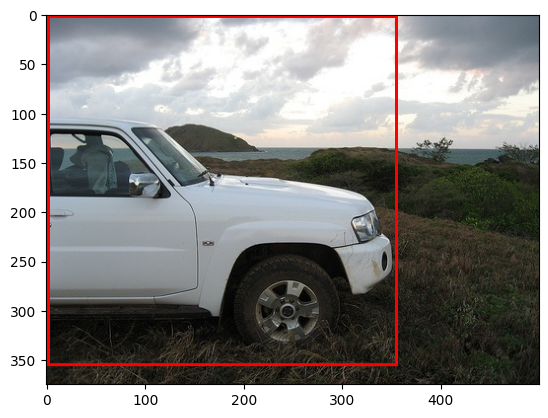

In [7]:
first = dataset[1]
im1 = first["image"].copy()
coords = first["box"][0]
draw = ImageDraw.Draw(im1) # a library to draw on pictures
draw.rectangle(coords, width=3, outline='red') 
# here we give the coordinates of the bounding box
# detecting the object
# we dicplay the image after all the modifications and added rectangles
plt.imshow(im1)

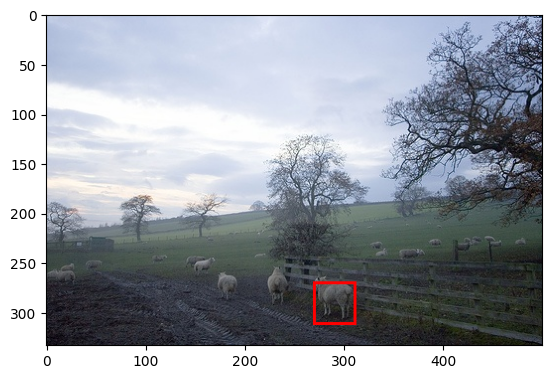

In [8]:
first = dataset[8]
im1 = first["image"].copy()
coords = first["box"][0]
draw = ImageDraw.Draw(im1) # a library to draw on pictures
draw.rectangle(coords, width=3, outline='red') 
# here we give the coordinates of the bounding box
# detecting the object
plt.imshow(im1)

In [17]:
from torchvision import transforms

In [22]:
print(dataset)

[{'box': [[2, 2, 500, 500]], 'label': ['bicycle'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F104D00FA0>}, {'box': [[1, 1, 356, 356]], 'label': ['car'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3D00>}, {'box': [[186, 186, 337, 337], [373, 373, 452, 452]], 'label': ['horse', 'horse'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x326 at 0x71F00BDC3D60>}, {'box': [[29, 29, 410, 410], [20, 20, 170, 170], [300, 300, 441, 441]], 'label': ['bicycle', 'chair', 'chair'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3DC0>}, {'box': [[219, 219, 295, 295]], 'label': ['dog'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x334 at 0x71F00BDC3E20>}, {'box': [[196, 196, 267, 267]], 'label': ['bird'], 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x71F00BDC3E80>}, {'box': [[89, 89, 375, 375]], 'label': ['bicycle'

In [ ]:
names = set()
for item in dataset:
    names.add(item['label'][0])
print(names)
converter = {}
for i, name in enumerate(names):
    converter[name] = i + 1

print(converter)

new_dataset = []
transformer = transforms.ToTensor()

def encoder(mapi, listo):
    finali = []
    for item in listo:
        finali.append(mapi[item])
    return finali


for obj in dataset:
    img_tensor = transformer(obj['image'])
    target = {}
    # target['box'] = []
    # target['labels'] = []
    box_tensor = torch.tensor(obj['box'])
    target['boxes'] = (box_tensor)
    listo = obj['label']
    encoded_list = encoder(converter, listo)
    
    labels_tensors = torch.tensor(encoded_list)
    target['labels'] = (labels_tensors)
    new_dataset.append((img_tensor, target))

# Here we transform the dataset into encoded values -> numbers instead of class labels we have numbers

{'tvmonitor', 'bicycle', 'bottle', 'aeroplane', 'sofa', 'bird', 'horse', 'train', 'sheep', 'boat', 'chair', 'cat', 'dog', 'motorbike', 'bus', 'diningtable', 'cow', 'car', 'pottedplant', 'person'}
{'tvmonitor': 1, 'bicycle': 2, 'bottle': 3, 'aeroplane': 4, 'sofa': 5, 'bird': 6, 'horse': 7, 'train': 8, 'sheep': 9, 'boat': 10, 'chair': 11, 'cat': 12, 'dog': 13, 'motorbike': 14, 'bus': 15, 'diningtable': 16, 'cow': 17, 'car': 18, 'pottedplant': 19, 'person': 20}


In [32]:
print(new_dataset)

[(tensor([[[0.0118, 0.0078, 0.0235,  ..., 0.6588, 0.6588, 0.6627],
         [0.0000, 0.0235, 0.0314,  ..., 0.6667, 0.6667, 0.6667],
         [0.0392, 0.0275, 0.0784,  ..., 0.6549, 0.6549, 0.6588],
         ...,
         [0.5569, 0.5608, 0.5686,  ..., 0.4627, 0.4549, 0.4549],
         [0.5647, 0.5608, 0.5608,  ..., 0.4588, 0.4510, 0.4510],
         [0.5647, 0.5569, 0.5569,  ..., 0.4667, 0.4706, 0.4667]],

        [[0.0314, 0.0235, 0.0157,  ..., 0.6235, 0.6275, 0.6314],
         [0.0000, 0.0196, 0.0157,  ..., 0.6314, 0.6353, 0.6353],
         [0.0157, 0.0039, 0.0431,  ..., 0.6314, 0.6314, 0.6353],
         ...,
         [0.5843, 0.5882, 0.5961,  ..., 0.4471, 0.4471, 0.4471],
         [0.5922, 0.5882, 0.5882,  ..., 0.4431, 0.4431, 0.4431],
         [0.5922, 0.5843, 0.5843,  ..., 0.4510, 0.4549, 0.4510]],

        [[0.0549, 0.0667, 0.1020,  ..., 0.6275, 0.6196, 0.6235],
         [0.0471, 0.0824, 0.1059,  ..., 0.6353, 0.6275, 0.6275],
         [0.1176, 0.1059, 0.1490,  ..., 0.6314, 0.6314, 

In [36]:
train_data, test_data = random_split(
    new_dataset,
    [int(0.8*len(new_dataset)),len(new_dataset) - int(0.8*len(new_dataset))]
)

In [38]:
print(train_data)
print(test_data)

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    weights="DEFAULT",
)

0.9%

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /home/users/mms00747/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100.0%


In [62]:
model.train()
op = optim.SGD(
        model.parameters(),
        lr=0.001,
        momentum=0.9,
        weight_decay=0.5

)
for epoch in range(100):
    for item in train_data:
        img, target = item
        loss_dict = model([img], [target]) # it returns the classification loss error and the box coordinates error
       
        op.zero_grad()
        loss = sum(l for l in loss_dict.values()) # so we sum the two tensors of the losses -> so we can apply the backprop
        # cause they are tensors objects
        if epoch % 10 == 0:
            print(loss.item())
        loss.backward() 
        op.step()



1.3736695051193237
1.146956443786621


KeyboardInterrupt: 

In [72]:
# model.eval()
# with torch.no_grad():
#     for epoch in range(100):
#         for item in test_data:
#             img, target = item
#             prediction = model([img], [target])
#             if epoch % 10 == 0:
#                 print(prediction)